In [1]:
# Common
import os
import keras
import numpy as np
from tqdm import tqdm 
from glob import glob
import tensorflow as tf
import tensorflow.image as tfi
from keras.preprocessing.image import load_img, img_to_array 
import matplotlib.pyplot as plt
from keras.layers import ReLU,Input,Conv2D,Dropout,ZeroPadding2D,LeakyReLU,concatenate,Conv2DTranspose,BatchNormalization
from keras.initializers import RandomNormal
from tensorflow.keras.optimizers import Adam
from keras.models import Sequential, Model, load_model
from tensorflow.keras.utils import plot_model
from keras.losses import BinaryCrossentropy

2024-09-17 03:50:26.495285: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-09-17 03:50:26.495401: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-17 03:50:26.766327: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
def load_data(path, trim=None):
    paths = sorted(glob(path + "*.jpg"))
    
    if trim is not None:
        paths = sorted(glob(path + "*.jpg"))[:trim]
        
    images = np.zeros(shape=(len(paths), 256, 256, 3))
    masks = np.zeros(shape=(len(paths), 256, 256, 3))
    
    for i,path in tqdm(enumerate(paths), desc="Data"):
        image = tf.cast(img_to_array(load_img(path)), tf.float32)
        img = image[:,:600,:]
        mask = image[:,600:,:]
        images[i] = tfi.resize(img,(256,256))/255.
        masks[i] = tfi.resize(mask,(256,256))/255.
    return images, masks

path = "../input/pix2pix-dataset/maps/maps/train/"
dataset = load_data(path, trim=1000)

Data: 1000it [00:36, 27.72it/s]


In [3]:
BATCH_SIZE = 32
data = tf.data.Dataset.from_tensor_slices(dataset).shuffle(1000).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
org_data=tf.data.Dataset.from_tensor_slices(dataset[0]).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
mask_data=tf.data.Dataset.from_tensor_slices(dataset[1]).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

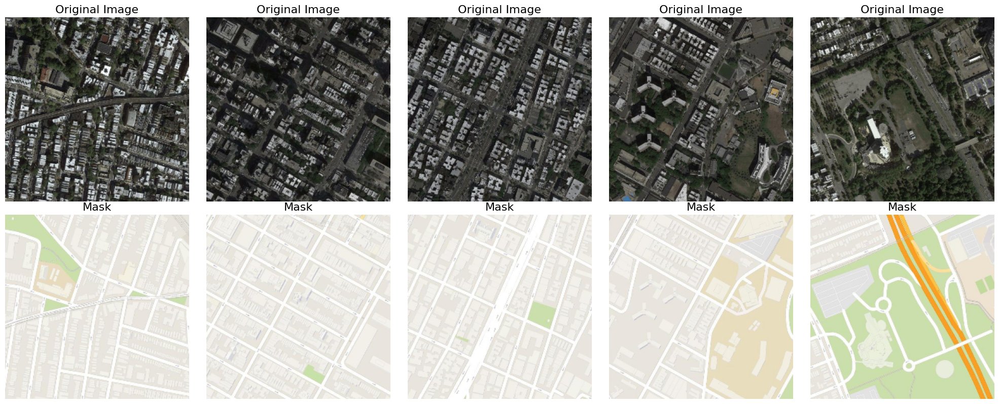

In [4]:
plt.figure(figsize=(20, 8))
for i in range(5):
    for image, mask in data.take(1):
        plt.subplot(2, 5, i+1)
        plt.imshow(image[i])
        plt.axis('off')
        plt.title("Original Image", fontsize=16)
        plt.subplot(2, 5, i+6)
        plt.imshow(mask[i])
        plt.axis('off')
        plt.title("Mask", fontsize=16)

plt.tight_layout()
plt.show()


In [5]:
def encoder(filters, size, apply_batchnorm=True):

    result = tf.keras.Sequential()
    result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',kernel_initializer='he_normal', use_bias=False))

    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())

    result.add(tf.keras.layers.LeakyReLU())
    return result


def decoder(filters, size, apply_dropout=False):

  result = tf.keras.Sequential()
  result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2,padding='same',kernel_initializer='he_normal',use_bias=False))
  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())
  return result

In [6]:
def Generator():
    inputs = tf.keras.layers.Input(shape=[256,256,3])

    down_stack = [
    encoder(64, 4, apply_batchnorm=False),
    encoder(128, 4), 
    encoder(256, 4), 
    encoder(512, 4), 
    encoder(512, 4), 
    encoder(512, 4), 
    encoder(512, 4), 
    encoder(512, 4), 
  ]

    up_stack = [
    decoder(512, 4, apply_dropout=True), 
    decoder(512, 4, apply_dropout=True), 
    decoder(512, 4, apply_dropout=True), 
    decoder(512, 4),
    decoder(256, 4),
    decoder(128, 4),
    decoder(64, 4), 
  ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(3, 4,strides=2,padding='same',kernel_initializer=initializer,activation='tanh') # (bs, 256, 256, 3)

    x = inputs

    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = tf.keras.layers.Concatenate()([x, skip])

    x = last(x)
    return tf.keras.Model(inputs=inputs, outputs=x)

generator = Generator()
generator.summary()

Model: "functional_16"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential          │ (None, 128, 128,  │      3,072 │ input_layer[0][0] │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_1        │ (None, 64, 64,    │    131,584 │ sequential[0][0]  │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_2        │ (None, 32, 32,    │    525,312 │ sequential_1[0][… │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_3        │ (None, 16, 16,    │  2,099,200 │ sequential_2[0][… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_4        │ (None, 8, 8, 512) │  4,196,352 │ sequential_3[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_5        │ (None, 4, 4, 512) │  4,196,352 │ sequential_4[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_6        │ (None, 2, 2, 512) │  4,196,352 │ sequential_5[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_7        │ (None, 1, 1, 512) │  4,196,352 │ sequential_6[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_8        │ (None, 2, 2, 512) │  4,196,352 │ sequential_7[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 2, 2,      │          0 │ sequential_8[0][… │
│ (Concatenate)       │ 1024)             │            │ sequential_6[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_9        │ (None, 4, 4, 512) │  8,390,656 │ concatenate[0][0] │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 4, 4,      │          0 │ sequential_9[0][… │
│ (Concatenate)       │ 1024)             │            │ sequential_5[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_10       │ (None, 8, 8, 512) │  8,390,656 │ concatenate_1[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 8, 8,      │          0 │ sequential_10[0]… │
│ (Concatenate)       │ 1024)             │            │ sequential_4[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_11       │ (None, 16, 16,    │  8,390,656 │ concatenate_2[0]… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_3       │ (None, 16, 16,    │          0 │ sequential_11[0]

 Total params: 54,425,859 (207.62 MB)

 Trainable params: 54,414,979 (207.58 MB)

 Non-trainable params: 10,880 (42.50 KB)

In [7]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar]) 

  down1 = encoder(64, 4, False)(x) 
  down2 = encoder(128, 4)(down1) 
  down3 = encoder(256, 4)(down2) 
  
  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) 
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1) 
  
  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) 

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

discriminator = Discriminator()
discriminator.summary()

Model: "functional_21"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_image         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ target_image        │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_7       │ (None, 256, 256,  │          0 │ input_image[0][0… │
│ (Concatenate)       │ 6)                │            │ target_image[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_15       │ (None, 128, 128,  │      6,144 │ concatenate_7[0]… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_16       │ (None, 64, 64,    │    131,584 │ sequential_15[0]… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_17       │ (None, 32, 32,    │    525,312 │ sequential_16[0]… │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 34, 34,    │          0 │ sequential_17[0]… │
│ (ZeroPadding2D)     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_11 (Conv2D)  │ (None, 31, 31,    │  2,097,152 │ zero_padding2d[0… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 31, 31,    │      2,048 │ conv2d_11[0][0]   │
│ (BatchNormalizatio… │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_11      │ (None, 31, 31,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 33, 33,    │          0 │ leaky_re_lu_11[0… │
│ (ZeroPadding2D)     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_12 (Conv2D)  │ (None, 30, 30, 1) │      8,193 │ zero_padding2d_1… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 2,770,433 (10.57 MB)

 Trainable params: 2,768,641 (10.56 MB)

 Non-trainable params: 1,792 (7.00 KB)

In [8]:
genLoss=[]
discLoss=[]

In [9]:
loss_object = BinaryCrossentropy(from_logits=True)
generator_optimizer = Adam(learning_rate=2e-4, beta_1=0.5)
discriminator_optimizer = Adam(learning_rate=2e-4, beta_1=0.5)
LAMBDA = 100

In [10]:
def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    total_gen_loss = gan_loss + (LAMBDA * l1_loss)
    genLoss.append(total_gen_loss)
    return total_gen_loss, gan_loss, l1_loss

def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    discLoss.append(total_disc_loss)
    return total_disc_loss

In [11]:
@tf.function()
def train_step(input_image, target_image, epoch):
    input_image, target_image = tf.cast(input_image, tf.float32), tf.cast(target_image, tf.float32)
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image, training=True)
        
        dis_real_output = discriminator([input_image, target_image], training=True)
        dis_gen_output = discriminator([input_image, gen_output], training=True)        
        
        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(dis_gen_output, gen_output, target_image)
        dis_loss = discriminator_loss(dis_real_output, dis_gen_output)
        
    generator_grads = gen_tape.gradient(gen_total_loss, generator.trainable_variables)
    discriminator_grads = disc_tape.gradient(dis_loss, discriminator.trainable_variables)
    
    generator_optimizer.apply_gradients(zip(generator_grads, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_grads, discriminator.trainable_variables))

In [12]:
import time
def fit(train_ds, epochs,):
  for epoch in range(epochs):
    start = time.time()
    print("Epoch: ", epoch+1)
    for n, (input_image, target) in train_ds.enumerate():
      train_step(input_image, target, epoch)
    print()
    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,time.time()-start))

In [13]:
def generate_images(model, test_input, tar):
    prediction = model(test_input, training=True)
    plt.figure(figsize=(15,15))
    display_list = [test_input[0], tar[0], prediction[0]]
    title = ['Input Image', 'Ground Truth', 'Predicted Image']
    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        print(test_input[0].shape)
        plt.imshow(display_list[i])
        plt.axis('off')
    plt.show()

In [14]:
hist=fit(data, epochs = 50)


Epoch:  1


2024-09-17 03:51:59.336458: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_16_1/sequential_8_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer



Time taken for epoch 1 is 80.90686702728271 sec

Epoch:  2


2024-09-17 03:53:14.406309: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_16_1/sequential_8_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer



Time taken for epoch 2 is 43.473127365112305 sec

Epoch:  3


2024-09-17 03:54:35.192773: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_16_1/sequential_8_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer



Time taken for epoch 3 is 44.41445755958557 sec

Epoch:  4

Time taken for epoch 4 is 44.01771283149719 sec

Epoch:  5


2024-09-17 03:56:03.303798: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_16_1/sequential_8_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer



Time taken for epoch 5 is 44.11604309082031 sec

Epoch:  6

Time taken for epoch 6 is 44.660619497299194 sec

Epoch:  7


2024-09-17 03:57:31.995545: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_16_1/sequential_8_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer



Time taken for epoch 7 is 44.003334045410156 sec

Epoch:  8

Time taken for epoch 8 is 44.08161377906799 sec

Epoch:  9


2024-09-17 03:59:00.707355: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_16_1/sequential_8_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer



Time taken for epoch 9 is 44.626631021499634 sec

Epoch:  10

Time taken for epoch 10 is 44.22662830352783 sec

Epoch:  11


2024-09-17 04:00:29.477400: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_16_1/sequential_8_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer



Time taken for epoch 11 is 44.54182267189026 sec

Epoch:  12

Time taken for epoch 12 is 44.17713117599487 sec

Epoch:  13


2024-09-17 04:01:58.671536: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_16_1/sequential_8_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer



Time taken for epoch 13 is 45.03325939178467 sec

Epoch:  14

Time taken for epoch 14 is 44.17774796485901 sec

Epoch:  15


2024-09-17 04:03:26.994469: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_16_1/sequential_8_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer



Time taken for epoch 15 is 44.12362480163574 sec

Epoch:  16

Time taken for epoch 16 is 44.08469295501709 sec

Epoch:  17


2024-09-17 04:04:55.305561: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_16_1/sequential_8_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer



Time taken for epoch 17 is 44.24027371406555 sec

Epoch:  18

Time taken for epoch 18 is 45.05108046531677 sec

Epoch:  19


2024-09-17 04:06:24.579164: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_16_1/sequential_8_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer



Time taken for epoch 19 is 44.22646522521973 sec

Epoch:  20

Time taken for epoch 20 is 44.211087703704834 sec

Epoch:  21


2024-09-17 04:07:52.994646: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_16_1/sequential_8_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer



Time taken for epoch 21 is 44.18668580055237 sec

Epoch:  22

Time taken for epoch 22 is 44.03715944290161 sec

Epoch:  23


2024-09-17 04:09:21.184986: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_16_1/sequential_8_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer



Time taken for epoch 23 is 44.15443754196167 sec

Epoch:  24

Time taken for epoch 24 is 45.87572479248047 sec

Epoch:  25


2024-09-17 04:10:51.303825: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_16_1/sequential_8_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer



Time taken for epoch 25 is 44.25714445114136 sec

Epoch:  26

Time taken for epoch 26 is 44.103909492492676 sec

Epoch:  27


2024-09-17 04:12:19.572586: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_16_1/sequential_8_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer



Time taken for epoch 27 is 44.14514660835266 sec

Epoch:  28

Time taken for epoch 28 is 44.25121068954468 sec

Epoch:  29


2024-09-17 04:13:47.941098: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_16_1/sequential_8_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer



Time taken for epoch 29 is 44.09812021255493 sec

Epoch:  30

Time taken for epoch 30 is 44.343350887298584 sec

Epoch:  31


2024-09-17 04:15:16.418319: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_16_1/sequential_8_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer



Time taken for epoch 31 is 44.12658333778381 sec

Epoch:  32

Time taken for epoch 32 is 45.81279230117798 sec

Epoch:  33


2024-09-17 04:16:46.405391: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_16_1/sequential_8_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer



Time taken for epoch 33 is 44.20861554145813 sec

Epoch:  34

Time taken for epoch 34 is 44.27183270454407 sec

Epoch:  35


2024-09-17 04:18:14.996679: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_16_1/sequential_8_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer



Time taken for epoch 35 is 44.2917640209198 sec

Epoch:  36

Time taken for epoch 36 is 44.03888750076294 sec

Epoch:  37


2024-09-17 04:19:43.232692: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_16_1/sequential_8_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer



Time taken for epoch 37 is 44.24692463874817 sec

Epoch:  38

Time taken for epoch 38 is 44.1790554523468 sec

Epoch:  39


2024-09-17 04:21:11.624277: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_16_1/sequential_8_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer



Time taken for epoch 39 is 44.13435673713684 sec

Epoch:  40

Time taken for epoch 40 is 44.225571632385254 sec

Epoch:  41


2024-09-17 04:22:41.992050: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_16_1/sequential_8_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer



Time taken for epoch 41 is 46.19296312332153 sec

Epoch:  42

Time taken for epoch 42 is 44.23453640937805 sec

Epoch:  43


2024-09-17 04:24:10.446824: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_16_1/sequential_8_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer



Time taken for epoch 43 is 44.23664212226868 sec

Epoch:  44

Time taken for epoch 44 is 44.24258375167847 sec

Epoch:  45


2024-09-17 04:25:38.916700: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_16_1/sequential_8_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer



Time taken for epoch 45 is 44.220601081848145 sec

Epoch:  46

Time taken for epoch 46 is 44.16706728935242 sec

Epoch:  47


2024-09-17 04:27:07.098490: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_16_1/sequential_8_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer



Time taken for epoch 47 is 43.9792537689209 sec

Epoch:  48

Time taken for epoch 48 is 44.1575984954834 sec

Epoch:  49


2024-09-17 04:28:35.407597: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape infunctional_16_1/sequential_8_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer



Time taken for epoch 49 is 44.15155100822449 sec

Epoch:  50

Time taken for epoch 50 is 44.237579345703125 sec



(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


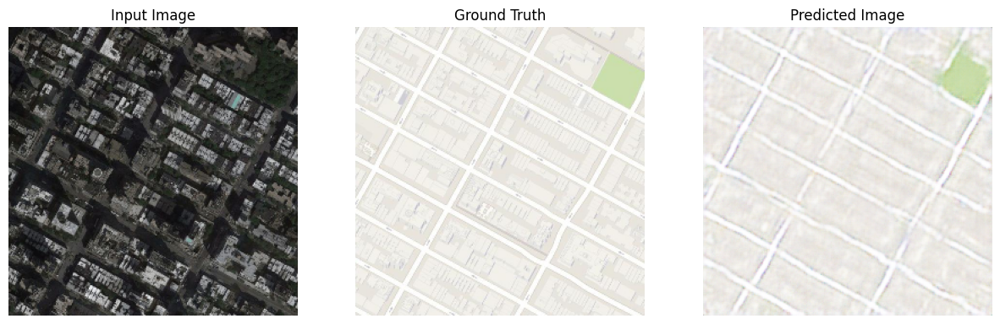

(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


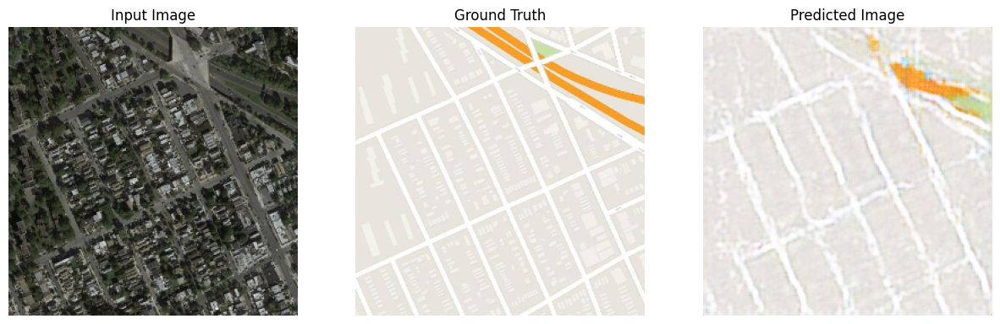

(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


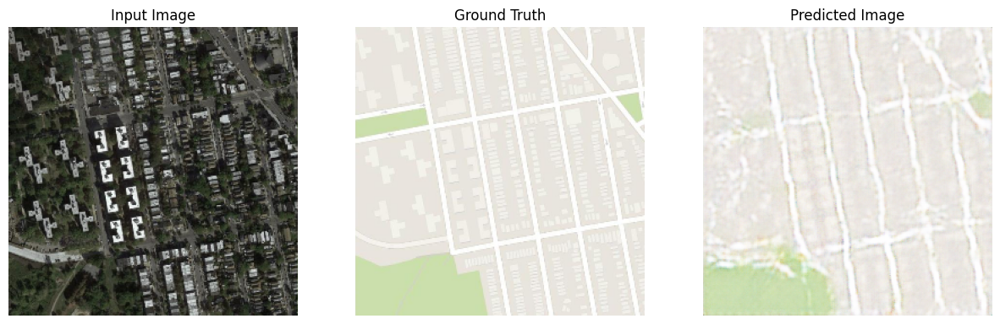

(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


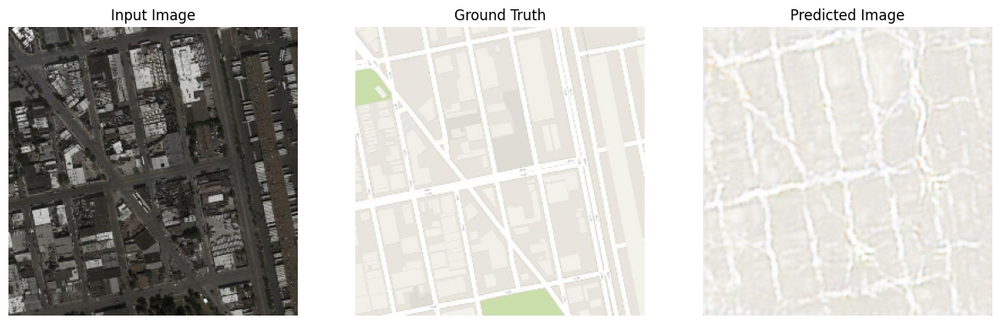

(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


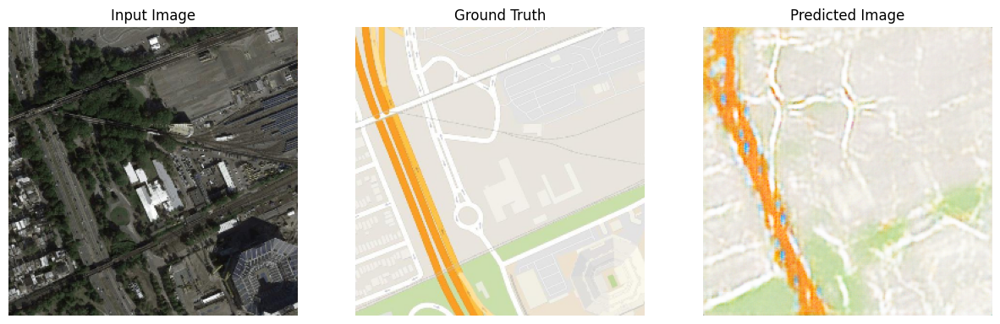

In [15]:
for example_input, example_target in tf.data.Dataset.zip((org_data, mask_data)).shuffle(buffer_size=10000).take(5):
  generate_images(generator, example_input, example_target)

In [16]:
model_Generator_json=generator.to_json()
model_discriminator_json=discriminator.to_json()

In [19]:
with open('modelGenerator.json','w') as json_file:
  json_file.write(model_Generator_json)
generator.save_weights('modelGen.weights.h5')
print('saved model to disk')



with open('modelDescriminator.json','w') as json_file:
  json_file.write(model_discriminator_json)
generator.save_weights('modelDis.weights.h5')
print('saved model  Dis to disk')

saved model to disk
saved model  Dis to disk


In [21]:
from tensorflow.keras.models import model_from_json
json_file = open('/kaggle/working/modelGenerator.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)
loaded_model.load_weights("/kaggle/working/modelGen.weights.h5")
print("Loaded model from disk")

loaded_model.compile(loss='binary_crossentropy', optimizer='rmsprop', metrics=['accuracy'])


Loaded model from disk


In [22]:
loaded_model.summary()

Model: "functional_16"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential          │ (None, 128, 128,  │      3,072 │ input_layer[0][0] │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_1        │ (None, 64, 64,    │    131,584 │ sequential[0][0]  │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_2        │ (None, 32, 32,    │    525,312 │ sequential_1[0][… │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_3        │ (None, 16, 16,    │  2,099,200 │ sequential_2[0][… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_4        │ (None, 8, 8, 512) │  4,196,352 │ sequential_3[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_5        │ (None, 4, 4, 512) │  4,196,352 │ sequential_4[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_6        │ (None, 2, 2, 512) │  4,196,352 │ sequential_5[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_7        │ (None, 1, 1, 512) │  4,196,352 │ sequential_6[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_8        │ (None, 2, 2, 512) │  4,196,352 │ sequential_7[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 2, 2,      │          0 │ sequential_8[0][… │
│ (Concatenate)       │ 1024)             │            │ sequential_6[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_9        │ (None, 4, 4, 512) │  8,390,656 │ concatenate[0][0] │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 4, 4,      │          0 │ sequential_9[0][… │
│ (Concatenate)       │ 1024)             │            │ sequential_5[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_10       │ (None, 8, 8, 512) │  8,390,656 │ concatenate_1[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 8, 8,      │          0 │ sequential_10[0]… │
│ (Concatenate)       │ 1024)             │            │ sequential_4[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_11       │ (None, 16, 16,    │  8,390,656 │ concatenate_2[0]… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_3       │ (None, 16, 16,    │          0 │ sequential_11[0]

 Total params: 54,425,859 (207.62 MB)

 Trainable params: 54,414,979 (207.58 MB)

 Non-trainable params: 10,880 (42.50 KB)

In [23]:
path = "../input/pix2pix-dataset/maps/maps/val/"
dataset = load_data(path, trim=1000)

Data: 1000it [00:22, 45.10it/s]


In [24]:
org_data=tf.data.Dataset.from_tensor_slices(dataset[0]).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
mask_data=tf.data.Dataset.from_tensor_slices(dataset[1]).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


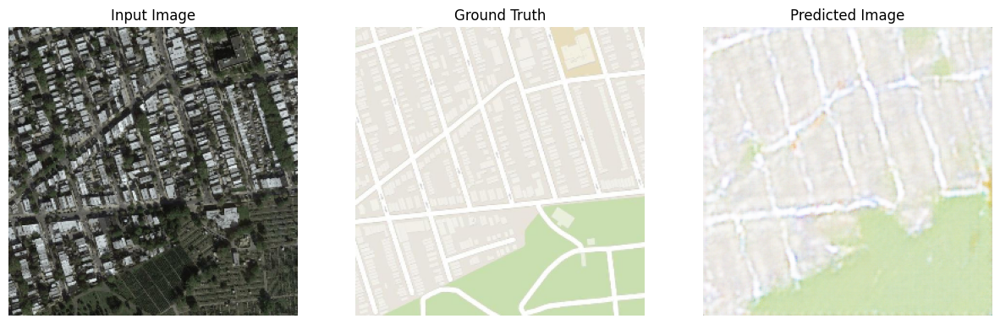

(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


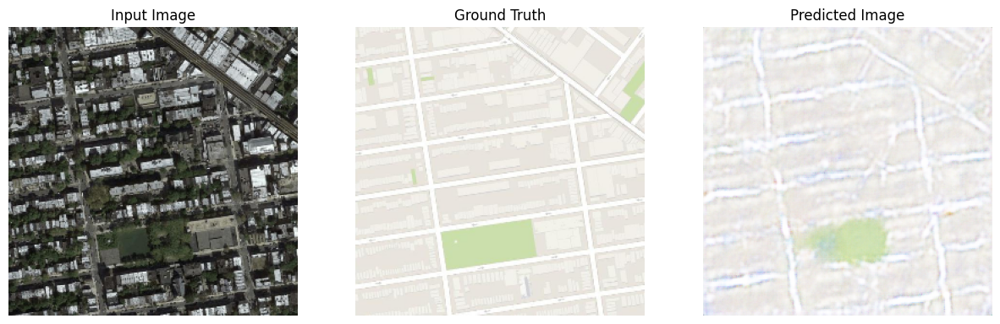

(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


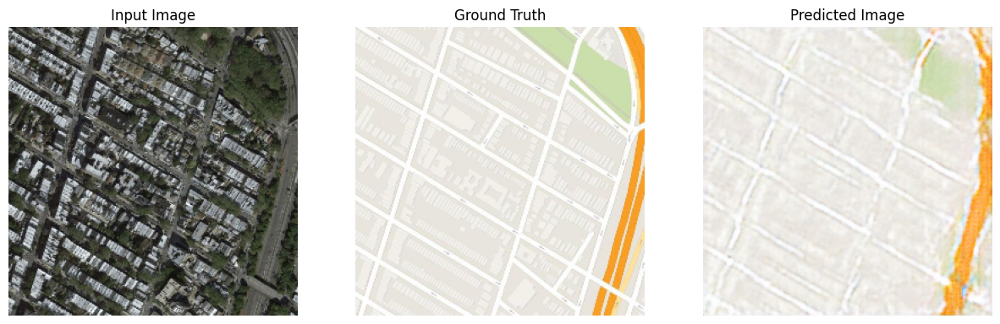

(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


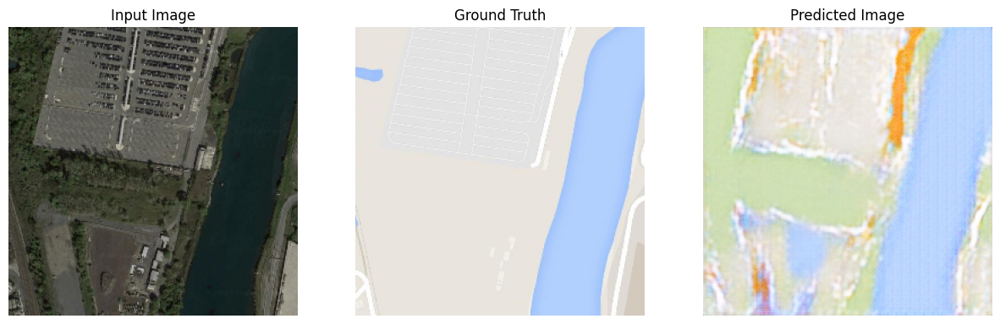

(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


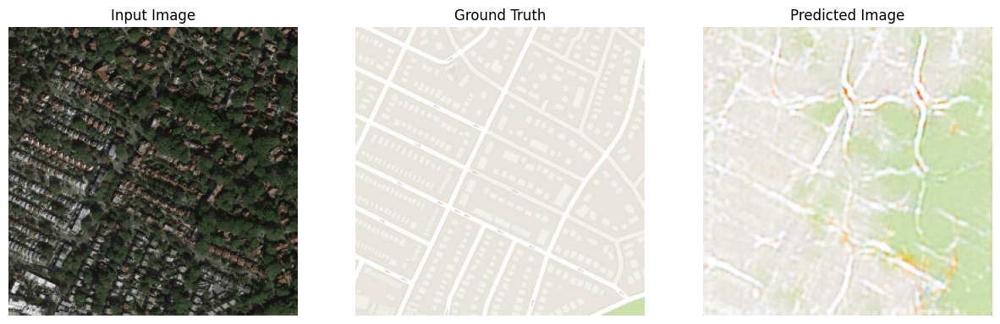

In [25]:
for example_input, example_target in tf.data.Dataset.zip((org_data, mask_data)).shuffle(buffer_size=10000).take(5):
  generate_images(generator, example_input, example_target)